# **Importaciones**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [2]:
import warnings

warnings.filterwarnings("ignore", category=UserWarning, message="Glyph 13")

# **Leer Data**

In [3]:
df = pd.read_csv('../data/Innova_2022.csv', encoding='utf-8', index_col=0)
df = df.T
df.head()

,Global Innovation Index,Innovation Input Sub-index,Innovation Output Sub-index,Institutions,Political environment,Political and operational stability,Government effectiveness,Regulatory environment,Regulatory quality,Rule of law,...,"Cultural and creative services exports, % total trade",National feature films/mn pop. 15ñ69,Entertainment and media market/th pop. 15ñ69,"Printing and other media, % manufacturing","Creative goods exports, % total trade",Online creativity,Generic top-level domains (TLDs)/th pop. 15ñ69,Country-code TLDs/th pop. 15ñ69,GitHub commits/mn pop. 15ñ69,Mobile app creation/bn PPP$ GDP
Albania,24.4,35.3,13.6,51.4,57.9,69.1,46.8,59.2,50.9,36.8,...,36.1,8.3,0.0,100.0,0.5,3.9,6.7,3.5,4.9,0.5
Algeria,16.7,26.7,6.7,47.2,47.4,56.4,38.4,50.4,12.7,25.8,...,0.3,0.9,0.8,4.0,0.1,0.7,0.5,0.1,2.2,0.1
Angola,13.9,21.1,6.8,41.9,43.0,61.8,24.3,51.1,22.3,21.1,...,0.0,0.0,0.0,60.6,0.1,0.1,0.0,0.1,0.2,0.0
Argentina,28.6,35.6,21.6,47.6,54.3,63.6,45.0,44.1,30.8,33.9,...,30.0,32.5,4.5,0.0,1.1,5.9,3.1,6.3,7.4,6.8
Armenia,26.6,34.3,18.9,59.7,54.4,61.8,47.0,68.8,51.2,43.9,...,10.3,0.0,0.0,39.8,9.0,6.6,3.1,5.1,8.0,10.1


In [4]:
keys = df.keys()

keys_x = []
keys_data = []

for i in keys:
  if i != ' Global Innovation Index' or \
     i != ' Innovation Input Sub-index' or \
     i != ' Innovation Output Sub-index':
    keys_x.append(i)
  keys_data.append(i)

X = df[keys_x].values
Y = df[' Global Innovation Index'].values

# **Análisis Exploratorio de Datos (EDA)**

 Primeramente, en el análisis de datos se realizará un estudio de los datos y su estructura. Con ello, se creará una tabla con los datos importantes acerca de los parámetros como los cuartiles, las medias, máximos y mínimos.

In [5]:
print(df.shape)
df.describe()

(132, 112)


,Global Innovation Index,Innovation Input Sub-index,Innovation Output Sub-index,Institutions,Political environment,Political and operational stability,Government effectiveness,Regulatory environment,Regulatory quality,Rule of law,...,"Cultural and creative services exports, % total trade",National feature films/mn pop. 15ñ69,Entertainment and media market/th pop. 15ñ69,"Printing and other media, % manufacturing","Creative goods exports, % total trade",Online creativity,Generic top-level domains (TLDs)/th pop. 15ñ69,Country-code TLDs/th pop. 15ñ69,GitHub commits/mn pop. 15ñ69,Mobile app creation/bn PPP$ GDP
count,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000
mean,31.535606,39.991667,23.084091,58.075000,61.198485,68.470455,53.928030,64.706061,50.643939,49.107576,...,14.340909,10.290909,12.055303,21.184848,16.160606,12.533333,13.966667,14.755303,13.194697,8.056061
std,13.681459,13.160716,14.841611,14.907482,16.456220,14.210617,19.791633,17.209143,22.353565,24.667182,...,20.305149,15.636644,22.222316,22.270284,26.110887,16.788708,23.704513,25.177678,19.546470,13.135165
min,11.600000,19.200000,1.100000,17.500000,0.000000,0.000000,0.000000,21.300000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.900000,28.775000,10.075000,47.125000,48.900000,60.000000,38.325000,53.000000,33.575000,30.475000,...,0.400000,0.000000,0.000000,0.000000,1.100000,1.075000,0.750000,0.475000,1.200000,0.100000
50%,28.800000,38.200000,20.150000,56.050000,58.900000,69.100000,50.700000,64.550000,48.150000,43.800000,...,6.400000,1.850000,0.000000,16.750000,4.650000,4.000000,2.800000,2.250000,3.750000,2.400000
75%,40.000000,48.175000,33.225000,68.800000,75.350000,80.000000,69.550000,76.900000,68.500000,69.925000,...,19.450000,16.075000,10.650000,30.075000,19.100000,17.075000,13.475000,14.400000,19.375000,11.650000
max,64.600000,70.600000,61.700000,95.900000,100.000000,100.000000,100.000000,98.700000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,63.600000,100.000000,100.000000,100.000000,100.000000


Se puede observar que los datos se componene de 112 columnas, donde 109 de ellas se corresponden con las variables y las otras 3 columnas correspondientes a los indices de *Global Innovation Index* (GII), *Innovation Input Sub-index* (IISi) y *Innovation Output Sub-index* (IOSi). Además de ello, se observan 132 filas de datos representando a los países. Mediante un análisis sencillo se observa que los valores tienen rangos muy diferentes siendo en unos casos muy altos y en otros muy pequeños.

Continuando, se ve la información de los parámetros dados, siendo todos estos del mismo tipo (float64) y no nulos. Esto nos facilita mucho las cosas ya que no tendremos que rellenar datos y realizar adaptaciones dependiendo del tipo de dato.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 132 entries, Albania to Zimbabwe
Columns: 112 entries,  Global Innovation Index to Mobile app creation/bn PPP$ GDP
dtypes: float64(112)
memory usage: 116.5+ KB


A partir de este punto, se comprueba la distribución de la métrica GII sin toques, su distribución radical y su distribución logarítmica. Con ello, permite observar su distribución, siendo la original muy asimétrica, pudiendo el logaritmo o la raíz cuadrada poder cambiar esta distribución a una más simétrica.

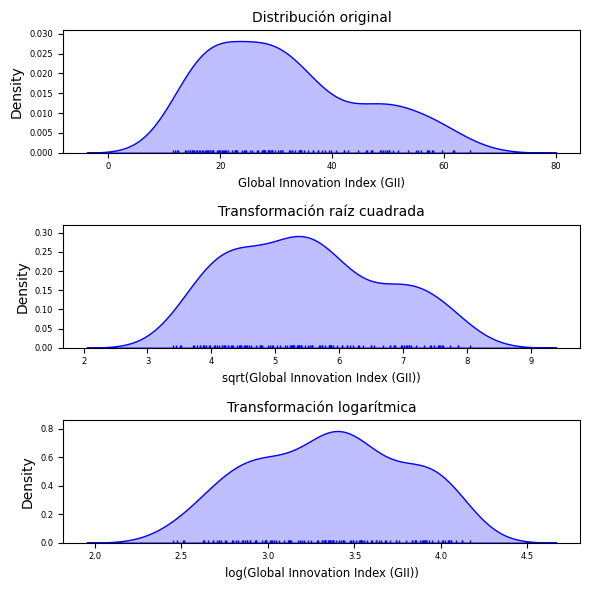

In [7]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 6))
sns.kdeplot(df[' Global Innovation Index'], fill = True, color = 'blue', ax = axes[0])
sns.rugplot(df[' Global Innovation Index'], color = 'blue', ax = axes[0])
axes[0].set_title('Distribución original', fontsize = 'medium')
axes[0].set_xlabel('Global Innovation Index (GII)', fontsize='small') 
axes[0].tick_params(labelsize = 6)

sns.kdeplot(np.sqrt(df[' Global Innovation Index']), fill = True, color = 'blue', ax = axes[1])
sns.rugplot(np.sqrt(df[' Global Innovation Index']), color = 'blue', ax = axes[1])
axes[1].set_title('Transformación raíz cuadrada', fontsize = 'medium')
axes[1].set_xlabel('sqrt(Global Innovation Index (GII))', fontsize='small') 
axes[1].tick_params(labelsize = 6)

sns.kdeplot(np.log(df[' Global Innovation Index']), fill = True, color = 'blue', ax = axes[2])
sns.rugplot(np.log(df[' Global Innovation Index']), color = 'blue', ax = axes[2])
axes[2].set_title('Transformación logarítmica', fontsize = 'medium')
axes[2].set_xlabel('log(Global Innovation Index (GII))', fontsize='small') 
axes[2].tick_params(labelsize = 6)

fig.tight_layout()
fig.savefig('../images/EDA/dist_GII.png')

Continuando con el análisis de datos, se realizará una representación de los datos mediante diagramas de caja, para observar su distribución intercualtílica y los posibles outliners. Se observa en las variables "apcp" una distribución anormal, en otros casos como "tcdc", "tcolc" y "ulwrf" se observan una gran cantidad de outliners que sobrepasa los rangos intercuartílicos. Por último, cabe referenciar casos excepcionales como los de "dswrf_s1_1" y "uswrf_s1_1".

In [8]:
fig, axes = plt.subplots(nrows=28, ncols=4, figsize=(100, 125))
axes = axes.flat

for i, colum in enumerate(keys_x):
    sns.boxplot(
        data     = df,
        x        = colum,
        color    = (list(plt.rcParams['axes.prop_cycle']) * 2)[i % 9]['color'],
        ax       = axes[i]
    )
    axes[i].set_title(colum, fontsize=32, fontweight='bold')
    axes[i].tick_params(labelsize=8)
    axes[i].set_xlabel('')
    
    
fig.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('Diagrama de caja', fontsize=96, fontweight='bold')
fig.savefig('../images/EDA/boxplot_params.png')

A continuación vemos la distribución de los parámetros. Lo separamos en 15 filas (representando las variables) y en 5 columnas (indicando cada instancia de tiempo). Podemos observar que en todas las variables, excepto "*uswrf_sfc*", tiene una misma o similar distribución en todas sus instancias. A su vez hay ciertas variables como "*apcp_sfc*", "*tcdc_eatm*" y "*tcolc_eatm*" que su distribución es muy variable, llegando a tener valores distintos en cada instancia.

In [9]:
fig, axes = plt.subplots(nrows=28, ncols=4, figsize=(100, 125))
axes = axes.flat

for i, colum in enumerate(keys_x):
    sns.histplot(
        data     = df,
        x        = colum,
        stat     = 'count',
        kde      = True,
        color    = (list(plt.rcParams['axes.prop_cycle']) * 2)[i % 9]['color'],
        line_kws = {'linewidth': 2},
        alpha    = 0.3,
        ax       = axes[i]
    )
    axes[i].set_title(colum, fontsize=32, fontweight='bold')
    axes[i].tick_params(labelsize=8)
    axes[i].set_xlabel('')
    
    
fig.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('Distribución parámetros', fontsize=96, fontweight='bold')
fig.savefig('../images/EDA/dist_params.png')

Una vez estudiada la distribución de la Energía Solar obtenida y de sus variables meteorológicas, debemos ver la relación de la primera con cada una de estas, pudiendo determinar qué variables son aquellas que más afecta a la producción.
Por lo general, a mayor es el valor de la variable, más Energía Solar se obtiene, solo hay 4 variables que amenoran la energía obtenida, siendo "*apcp_sfc*", "*pres_msl*", "*tdc_eatm*" y "*tcolc_eatm*".

In [10]:
fig, axes = plt.subplots(nrows=28, ncols=4, figsize=(100, 125))
axes = axes.flat

for i, colum in enumerate(keys_x):
    sns.regplot(
        x           = df[colum],
        y           = df[' Global Innovation Index'],
        color       = 'gray',
        marker      = '.',
        scatter_kws = {'alpha': 0.4},
        line_kws    = {'color': 'r', 'alpha': 0.7},
        ax          = axes[i]
    )
    axes[i].set_title(f'GII vs {colum}', fontsize=32, fontweight='bold')
    axes[i].ticklabel_format(style='sci', scilimits=(-4, 4), axis='both')
    axes[i].yaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].xaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].tick_params(labelsize=6)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

fig.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('GII vs Variables', fontsize=96, fontweight='bold')
fig.savefig('../images/EDA/regplot_params.png')

A su vez es necesario tener en cuenta la correlación de todas las variables, incluida la salida, entre ellas. Para ello se crea la matriz de correlación. Esto es útil para aquellos modelos que necesitan parámetros con menor grado de correlación.

In [11]:
def tidy_corr_matrix(matrix):
    matrix = matrix.stack().reset_index()
    matrix.columns = ['variable_1', 'variable_2', 'r']
    matrix = matrix.loc[matrix['variable_1'] != matrix['variable_2'], :]
    matrix['abs_r'] = np.abs(matrix['r'])
    matrix = matrix.sort_values('abs_r', ascending=False)
    return matrix

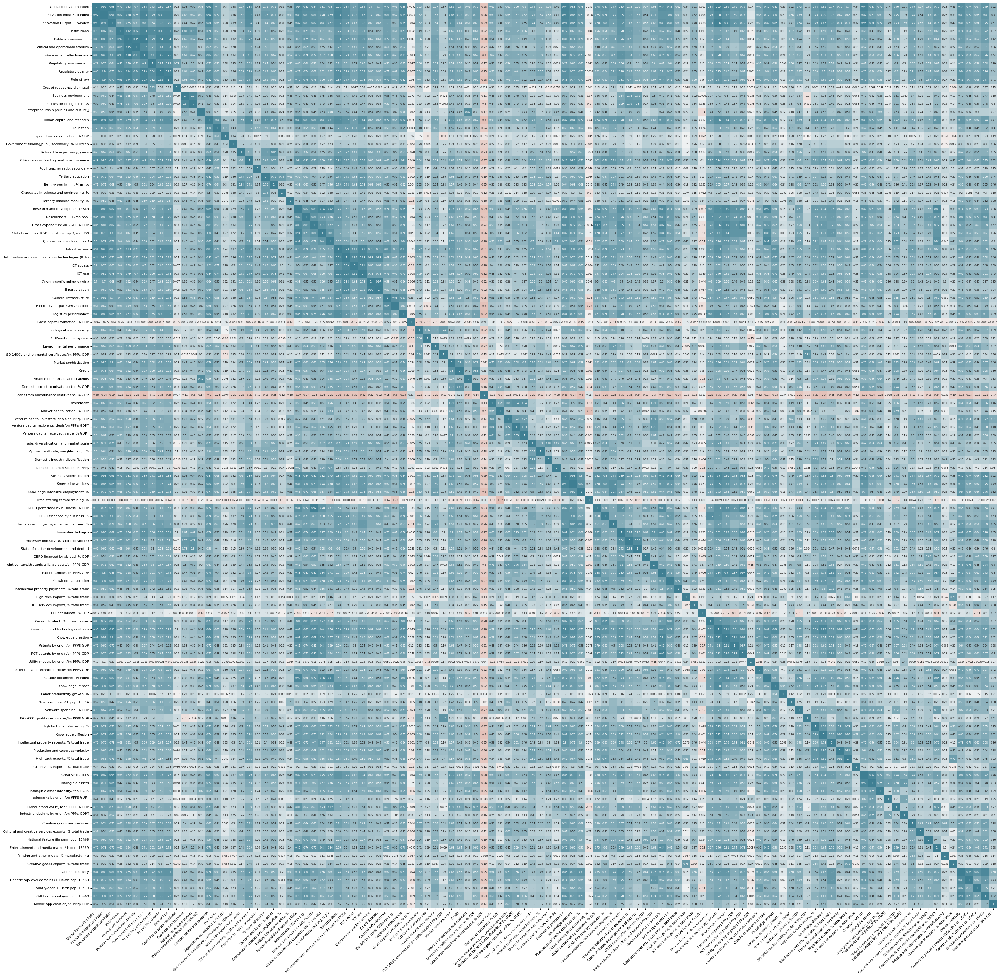

In [12]:
matrix_corr = df.select_dtypes(include=['float64']).corr(method='pearson')
tidy_corr_matrix(matrix_corr)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(40, 40))

fig = sns.heatmap(
        matrix_corr,
        annot     = True,
        cbar      = False,
        annot_kws = {'size': 6},
        vmin      = -1,
        vmax      = 1,
        center    = 0,
        cmap      = sns.diverging_palette(20, 220, n=200),
        square    = True,
        ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.tick_params(labelsize=8)
fig.get_figure().savefig('../images/EDA/matrix_correlation.png')